# Assignment 3
### Due 9/23. Do four of five.

1. 
- Open the NHANES (or Ames prices or college completion datasets, if you prefer)
- Find two categorical variables of interest (there are 198, and short descriptions are given in the `nhanes_meta_17_18.csv` file). Investigate their missing values (you don't have to focus on missing values for this analysis like we did with police use of force, but always be aware of how dirty the data are)
- Compute a contingency table for your categorical $X$ and $Y$
- Discuss any interesting patterns (or lack of one) that you observe

In [61]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv("/Users/hayeonchung/understanding_uncertainty/data/nhanes_data_17_18.csv")
df2 = pd.read_csv("/Users/hayeonchung/understanding_uncertainty/data/ames_prices.csv")

/var/folders/6y/d5yr54g90_nbghlfwx83ldb40000gn/T/ipykernel_18180/1911753466.py:6: DtypeWarning: Columns (142) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/Users/hayeonchung/understanding_uncertainty/data/nhanes_data_17_18.csv")


#### Investigating Missing Values 

In [53]:
df['DoctorToldYouHaveDiabetes_na'] = df['DoctorToldYouHaveDiabetes'].isna() 
df['DoctorToldYouHaveDiabetes_na'].value_counts() 

DoctorToldYouHaveDiabetes_na
False    8362
True        4
Name: count, dtype: int64

In [54]:
df['gender_na'] = df['Gender'].isna() 
df['gender_na'].value_counts() 

gender_na
False    8366
Name: count, dtype: int64

Both of these categorical variables, as seen by the na counts, are close to fully complete. This was expected as when I chose these variables in the dataset, I could see almost no missing entries when skimming through the rows.  

#### Contingency Table

In [55]:
pd.crosstab(df['DoctorToldYouHaveDiabetes_na'], df['Gender'],normalize='columns') 

Gender,Female,Male
DoctorToldYouHaveDiabetes_na,,
False,0.999298,0.999756
True,0.000702,0.000244


From the contingency table and counts, it can be said that the data is complete. Out of 8,366 records, only 4 are missing a response for DoctorToldYouHaveDiabetes and Gender has no missing values. Column-normalized proportions show an almost completely non-missing in both genders. The missing share is about 0.070% for females and 0.024% for males which is an extremely small difference that’s likely noise rather than a meaningful pattern. 

2. 
- Open the NHANES dataset
- Find a categorical and numeric variable of interest (there are 198, and short descriptions are given in the `nhanes_meta_17_18.csv` file). Investigate their missing values (you don't have to focus on missing values for this analysis, but always be aware of them)
- Make descriptive tables and grouped kernel density plots to represent the variation in your numeric $Y$ conditional on your categorical $X$
- Discuss any interesting patterns (or lack of one) that you observe

#### Investigating Missing Values 

In [43]:
df['DoYouNowSmokeCigarettes_na'] = df['DoYouNowSmokeCigarettes'].isna() 
df['DoYouNowSmokeCigarettes_na'].value_counts() 

DoYouNowSmokeCigarettes_na
True     6134
False    2232
Name: count, dtype: int64

In [44]:
df['CurrentSelfreportedWeightPounds_na'] = df['CurrentSelfreportedWeightPounds'].isna() 
df['CurrentSelfreportedWeightPounds_na'].value_counts() 

CurrentSelfreportedWeightPounds_na
False    5828
True     2538
Name: count, dtype: int64

These two variables have a good portion of their data missing as seen by the na value count outputs. Around 73% of the data is missing for DoYouNowSmokeCigarettes while around 30% of the data is missing for CurrentSelfreportedWeightPounds.

#### Descriptive Tables & Grouped Kernel Density Plots

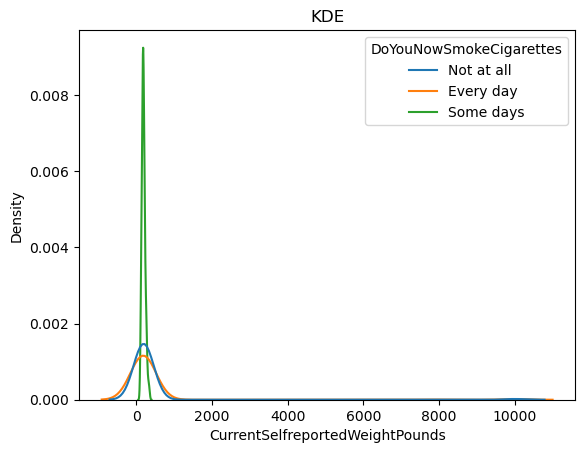

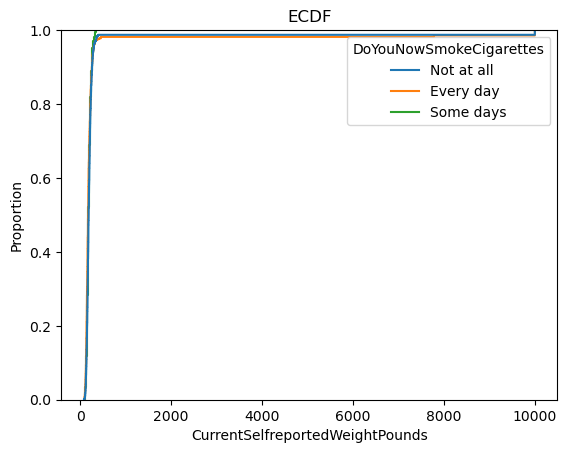

CurrentSelfreportedWeightPounds              \
                                                  count        mean   
DoYouNowSmokeCigarettes                                               
Every day                                         763.0  353.347313   
Not at all                                       1260.0  316.318254   
Some days                                         209.0  188.650718   

                                                                          
                                 std   min     25%    50%    75%     max  
DoYouNowSmokeCigarettes                                                   
Every day                1261.567811  86.0  145.00  174.0  210.0  9999.0  
Not at all               1099.648434  82.0  158.75  185.0  220.0  9999.0  
Some days                  46.155855  98.0  158.00  180.0  212.0   350.0

In [48]:
conditioner = 'DoYouNowSmokeCigarettes'
sns.kdeplot( data=df, x='CurrentSelfreportedWeightPounds', hue=conditioner, common_norm=False ).set(title='KDE')
plt.show()
sns.ecdfplot( data=df, x='CurrentSelfreportedWeightPounds', hue=conditioner).set(title='ECDF')
plt.show()
df.loc[:,['CurrentSelfreportedWeightPounds', conditioner]].groupby(conditioner).describe()

Across smoking status groups, the weight distributions look very similar. The KDE curves largely overlap and the ECDF lines sit almost on top of each other which suggests no strong separation by smoking. Looking at the robust summaries, the median weight is slightly higher for non-smokers than for everyday smokers and some-day smokers, with broadly comparable IQRs. The means are much larger for the first two groups because of extreme outliers (max values of 9,999 lb). This inflates the average and widens the SD so medians/IQRs are the appropriate summaries here. Note also that the “some days” group is relatively small (n about 209), and smoking status has substantial missingness overall which means that inferences apply only to the observed subset and may be sensitive to non-random missingness. Overall, there’s no compelling pattern linking current smoking frequency to markedly different weight distributions. At most, non-smokers appear modestly heavier on median and this difference is small relative to within-group variability.

4. I SWITCHED PROBLEMS 3 AND 4's ORDER; PROBLEM 4 IS BELOW PROBLEM 3! 
- Write a class or set of functions that implement the LCLS/Naradaya-Watson estimator, using the Silverman plug-in estimate for the conditioning variable $X$ as the bandwidth.
- From one of the course data sets, find two numeric variables of interest, analyze their relationship with the the LCLS/Naradaya-Watson estimator, and discuss your results.

In [70]:
# 1) grid from x
def make_grid(x):
    return np.sort(x.unique())

# 2) Silverman plug-in bandwidth for X
def silverman_h(x):
    iqr = np.quantile(x, .75) - np.quantile(x, .25)
    h = 0.9 * min(np.std(x), iqr / 1.34) * (len(x) ** (-0.2))
    return h

# 3) Gaussian kernel weights K for all x vs grid
def kernel_matrix(x, grid, h):
    I = -(x.to_numpy().reshape(-1,1) - grid.reshape(1,-1))**2
    K = np.exp(I / (2 * h**2)) / np.sqrt(2 * np.pi * h**2)
    return K

# 4) Nadaraya–Watson/LCLS estimator on the grid
def lcls_predict(x, y, h=None):
    grid = make_grid(x)
    if h is None:
        h = silverman_h(x)
        print(f'Computed bandwidth is: {h}')
    K = kernel_matrix(x, grid, h)
    numerator = y @ K
    denominator = np.sum(K, axis=0)
    y_hat = numerator / denominator
    return y_hat, grid, h

# 5) Plotting
def lcls_plot(df, grid, y_hat):
    sns.scatterplot(data=df, y='price', x='area', alpha=.05)
    sns.lineplot(x=grid, y=y_hat, color='orange')


Computed bandwidth is: 559.9303735698866


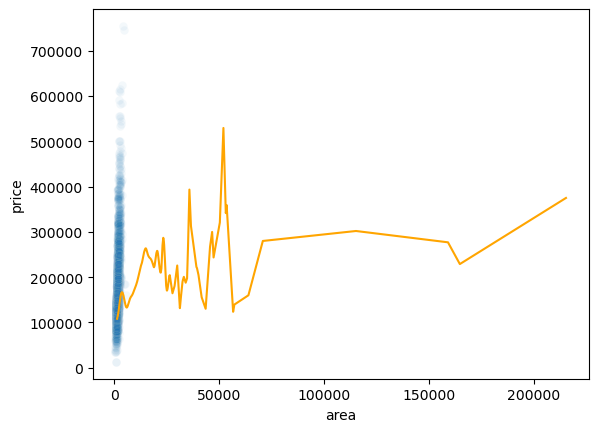

In [71]:
x = df2['Lot.Area']
y = df2['price']

y_hat, grid, h = lcls_predict(x, y)
lcls_plot(df2, grid, y_hat)

The orange smooth shows a non-linear but generally positive relationship. Prices rise quickly as lot size increases from the smallest parcels. Then, the curve flattens which suggests the diminishing returns to additional land once you reach moderate sizes. Beyond roughly the mid-range of Lot.Area, the fit becomes unstable which likely reflects data sparsity at very large lots. This means that a few observations can swing the average and produce bumps at the extremes. The scatter also indicates considerable spread in price at small lot sizes which implies other housing attributes driving a lot of the variation there. Overall, the kernel smoother captures a weak/moderate positive association with diminishing marginal effects and the most reliable interpretation is within the dense region of Lot.Area. The behavior in the far right tail should be treated with caution due to limited data.

3. 
We showed that the mean and median could be discovered by minimizing various kinds of loss functions; this is what machine learning is. To make a prediction $\hat{y}(z)$ of $Y$ when $X=z$, minimize the mean squared error:
$$
MSE(\hat{y}(z)) = \dfrac{1}{N} \sum_{i=1}^N \left\lbrace y_i - \hat{y}(z) \right\rbrace^2 \frac{1}{h}k\left(\frac{z-x_i}{h}\right)
$$
Show that the solution to this problem is the LCLS/Naradaya-Watson estimator.

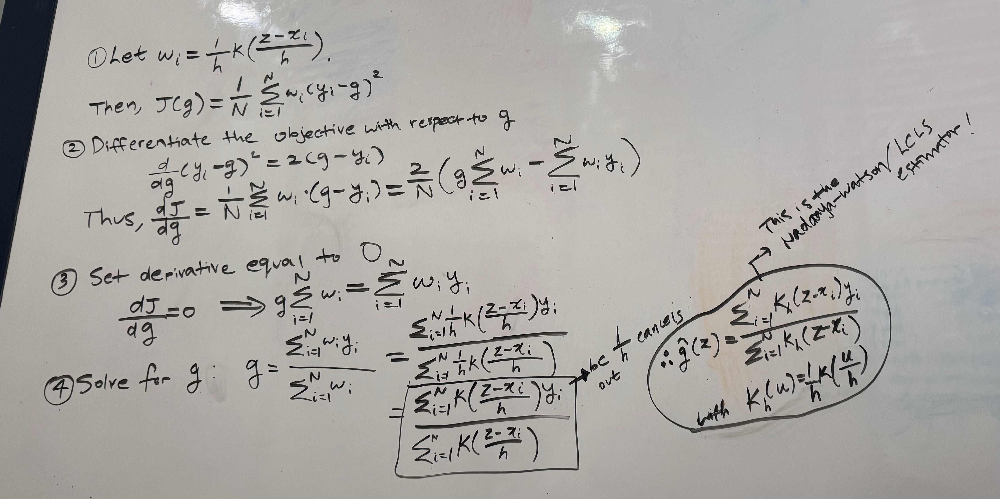

5. 
- In any of the available data sets, investigate the relationships between pairs of variables $(X,Y)$ with a scatterplot and CEF (for example, price on area)
- Is this relationship plausibly causal, or are there missing variables that might explain at least part of the relationship between your variables? These can be "conceptual" rather than "practical"; for example, 'talent' or 'grit' probably explain education outcomes, but are almost impossible to measure. We are asking whether there are hypothetical **threats to causal identification** of the effect of $X$ on $Y$.
- Explain how, regardless of the threat to causal identification, you can still use your model to predict $Y$ given $X$, as long as you don't intervene in the system to control the outcome